In [1]:
import pathlib
import random
import copy
import gc
import numpy as np
import torch
import torchvision
import quantus
import torchvision
from captum.attr import *
import matplotlib.pyplot as plt
from omegaconf import OmegaConf
import yaml
import argparse

from models.s4net import S4PatchedFinalNet,TrunkNet, HeadNet
from data.data_loader import load_eeg_data, get_sliding_window_data, create_dataloader
import os
import mne
from tqdm import tqdm
from scipy.signal import hilbert
from sklearn.preprocessing import MinMaxScaler
from scipy.io import loadmat
from tqdm import tqdm

import statsmodels.multivariate.multivariate_ols as mv_ols
import statsmodels.api as sm 
import pandas as pd

from scipy.signal import welch
from scipy.integrate import simpson

CUDA extension for structured kernels (Cauchy and Vandermonde multiplication) not found. Install by going to extensions/kernels/ and running `python setup.py install`, for improved speed and memory efficiency. Note that the kernel changed for state-spaces 4.0 and must be recompiled.


In [3]:
CFG_YAML = """
wandb:
 key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model:
dataset:
 data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/data
 #file_name: subject_{:03d}_preprocessed_combined_py.fif
 file_name: subject_{:03d}_preprocessed_combined_py.fif
 exclude_timepoints: 100
 subject_index: 1
 test_subject_indices: [1,2,13,24,26,27,29,34,35,41, 42,43,45,46,47,48,52,55,56,57,60,62,67,69,72,73,79,80,86,88,92,102]
 #test_subject_indices: [2]
training:
 training_start_len: 100
 pretrain_epochs: 100
 pretrain_lr: 0.0001
 val_window_len: 1
 epochs_per_window: 10
 num_warmup_epochs: 5
 num_epochs: 800
 slide_step: 1
 num_warmup_epochs_per_window: 0
 lr: 0.005 #maybe change back to 0.0001
 nll_beta: 0.001
 num_warmup_epochs: 0
 batch_size: 50 #better to use 50
 random_seed: 42
 precision: bf16
 kde_lambda: 0.5
 finetune_entire_model: true # Set to true to finetune the entire model, false for transformer only
exp_name: S4_S4EEGNet_ema
"""


def load_config():
    cfg = OmegaConf.create(yaml.safe_load(CFG_YAML))
    cfg.exp_name = f"{cfg.exp_name}_subject_{cfg.dataset.subject_index}"
    return cfg

def parse_args():
    parser = argparse.ArgumentParser()
    parser.add_argument("--update_conf", nargs="*", help="Updates to the configuration in the form of key=value pairs", default=[])
    parser.add_argument("-f", "--fff", help="A dummy argument to handle IPython's default argument", default="1")
    return parser.parse_args()

def update_config(cfg, cli_args):
    for update in cli_args.update_conf:
        key, value = update.split("=")
        try:
            value = eval(value)
        except:
            pass
        OmegaConf.update(cfg, key, value, force_add=True)
    cfg.exp_name = cfg.exp_name + "_" + "_".join(cli_args.update_conf)
    print(OmegaConf.to_yaml(cfg))
    return cfg


def save_config(cfg):
    os.makedirs("conf/sweeps", exist_ok=True)
    os.makedirs("exp/withinsubs", exist_ok=True)
    with open(f"conf/sweeps/withinsubs_{cfg.exp_name}.yaml", "w") as f:
        f.write(OmegaConf.to_yaml(cfg))


In [4]:
eeg_channels = ['Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T7', 'T8', 'P7', 'P8', 'Fz', 'Cz', 'Pz', 'Iz', 'FC1', 'FC2', 'CP1', 'CP2', 'FC5', 'FC6', 'CP5', 'CP6', 'F1', 'F2', 'C1', 'C2', 'P1', 'P2', 'AF3', 'AF4', 'FC3', 'FC4', 'CP3', 'CP4', 'PO3', 'PO4', 'F5', 'F6', 'C5', 'C6', 'P5', 'P6', 'AF7', 'AF8', 'FT7', 'FT8', 'TP7', 'TP8', 'PO7', 'PO8', 'Fpz', 'CPz', 'POz', 'Oz']

regions = {
    "frontal": ['Fp1', 'Fp2', 'F3', 'F4', 'F7', 'F8', 'Fz', 'AF3', 'AF4', 'AF7', 'AF8', 'F1', 'F2', 'F5', 'F6'],
    "temporal": ['T7', 'T8', 'FT7', 'FT8', 'TP7', 'TP8'],
    "parietal": ['P3', 'P4', 'P7', 'P8', 'Pz', 'P1', 'P2', 'P5', 'P6', 'PO3', 'PO4', 'PO7', 'PO8', 'POz'],
    "occipital": ['O1', 'O2', 'Oz', 'Iz'],
    "central": ['C3', 'C4', 'C1', 'C2', 'Cz', 'CP1', 'CP2', 'CP3', 'CP4', 'CPz', 'CP5', 'CP6']
}

pairs = {
    "frontal": [('Fp1', 'Fp2'), ('F3', 'F4'), ('F7', 'F8'), ('AF3', 'AF4'), ('AF7', 'AF8'), ('F1', 'F2'), ('F5', 'F6')],
    "temporal": [('T7', 'T8'), ('FT7', 'FT8'), ('TP7', 'TP8')],
    "parietal": [('P3', 'P4'), ('P7', 'P8'), ('P1', 'P2'), ('P5', 'P6'), ('PO3', 'PO4'), ('PO7', 'PO8')],
    "occipital": [('O1', 'O2')],
    "central": [('C3', 'C4'), ('C1', 'C2'), ('CP3', 'CP4'), ('CP1', 'CP2'), ('CP5', 'CP6')]
}

nested_dict = {}

for region, channels in regions.items():
    nested_dict[region] = pairs.get(region, [])

print(nested_dict)

cfg = load_config()
cwd = os.getcwd()
dir_path = os.path.join(cwd, "frequency_power_data")


{'frontal': [('Fp1', 'Fp2'), ('F3', 'F4'), ('F7', 'F8'), ('AF3', 'AF4'), ('AF7', 'AF8'), ('F1', 'F2'), ('F5', 'F6')], 'temporal': [('T7', 'T8'), ('FT7', 'FT8'), ('TP7', 'TP8')], 'parietal': [('P3', 'P4'), ('P7', 'P8'), ('P1', 'P2'), ('P5', 'P6'), ('PO3', 'PO4'), ('PO7', 'PO8')], 'occipital': [('O1', 'O2')], 'central': [('C3', 'C4'), ('C1', 'C2'), ('CP3', 'CP4'), ('CP1', 'CP2'), ('CP5', 'CP6')]}


In [5]:
import pickle
#cfg = load_config()

all_subject_power_data_integral = np.load(os.path.join(dir_path, "all_subject_power_data_integral.npy"), allow_pickle=True).item()
all_subject_power_data_average = np.load(os.path.join(dir_path, "all_subject_power_data_average.npy"), allow_pickle=True).item()
#all_subject_amplitude_data = np.load(os.path.join(dir_path, "all_subject_amplitude_data.npy"), allow_pickle=True).item()
#all_subject_uncertainty_data = np.load(os.path.join(dir_path, "all_subject_uncertainty_data.npy"), allow_pickle=True).item()
all_subject_amplitude_data = {}
all_subject_uncertainty_data = {}
data_path = "/home/marco/Documents/GitHub/tms_eeg_decoding/subject_interpretability"
for subject in cfg.dataset.test_subject_indices:
    with open(os.path.join(data_path, f"subject_{subject}_results.pkl"), 'rb') as f:
        data = pickle.load(f)
        all_subject_amplitude_data[subject] = data['predictions']
        all_subject_uncertainty_data[subject] = data['uncertainties']

In [6]:
# do for each subject separately. Give data[2] as input for subject 2
def compute_log_diff_average_per_trial(data, region, pairs):
    region_averages = {}
    
    channel_pairs = pairs.get(region, [])
    differences = []
    
    for ch1, ch2 in channel_pairs:
        if ch1 in data.keys() and ch2 in data.keys():
            log_diff = np.log(data[ch2]) - np.log(data[ch1])
            differences.append(log_diff)
    
    
    region_average = np.mean(differences)

 
    
    return region_average

# Example usage
region_averages = compute_log_diff_average_per_trial(all_subject_power_data_integral[2][300]["gamma"], 'temporal',  pairs)
print(region_averages)


def compute_log_diffs(data, pairs):
    log_diffs = {}
    for region_name, channel_pairs in pairs.items():
        for ch1, ch2 in channel_pairs:
            if ch1 in data.keys() and ch2 in data.keys():
                log_diff = np.log(data[ch2]) - np.log(data[ch1])
                log_diffs[(ch2+"_"+ch1)] = log_diff[0]
    return log_diffs

log_diffs_t300 = compute_log_diffs(all_subject_power_data_integral[2][300]["gamma"], pairs)


0.9946260230866925


In [7]:
freq_bands = {
    "theta": (4, 8),
    "alpha": (8, 13),
    "beta": (13, 30),
    "gamma": (30, 45)
}

In [8]:
#ToDo: store in dictionary, compute correlation with predicted amplitude for each trial
#Also instead of doing this for each frequency band, do it with data where all freq_bands are included
cfg = load_config()
data_all_subjects = {si : {b: {ch:[] for ch in log_diffs_t300.keys()} for b in freq_bands.keys()} for si in cfg.dataset.test_subject_indices}
for subject_index in cfg.dataset.test_subject_indices:
    for band_name, band in freq_bands.items():
        for trial_index in range(len(all_subject_power_data_integral[subject_index])):
                #region_average = compute_log_diff_average_per_trial(all_subject_power_data_integral[subject_index][trial_index][band_name], region_name,  pairs)
                log_diffs = compute_log_diffs(all_subject_power_data_integral[subject_index][trial_index][band_name], pairs)
                for ch_pairs, log_diff in log_diffs.items():
                    data_all_subjects[subject_index][band_name][ch_pairs].append(log_diff)
                
           #print(f"region_averages subject {subject_index} trial {trial_index} band {band_name}: {region_averages}")


({'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {'Fp2_Fp1': 0.33478032390583967, 'AF4_AF3': 0.3263413173523243, 'AF8_AF7': 0.3231063767947742, 'P8_P7': 0.30266050513344755, 'PO8_PO7': 0.5545783170075805, 'O2_O1': 0.6486812902824911, 'C4_C3': 0.4664148730826674, 'CP6_CP5': 0.36709991093126265}}, {'theta': {'Fp2_Fp1': -0.012496319484480765, 'F4_F3': -0.028294870265891968, 'F8_F7': -0.08019509635076515, 'AF4_AF3': 0.003811643006179017, 'AF8_AF7': -0.06791469036407843, 'F2_F1': -0.013021800164848772, 'F6_F5': -0.03435567102214501, 'T8_T7': 0.009518515764923843, 'FT8_FT7': -0.02025673663362921, 'TP8_TP7': -0.06547763971599457, 'P4_P3': -0.040395230984987804, 'P8_P7': -0.013100684280816243, 'P2_P1': -0.06360819127783654, 'P6_P5': 0.004411170629998015, 'PO4_PO3': -0.043707750584715925, 'PO8_PO7': -0.046964358688949236, 'O2_O1': -0.058104158679701125, 'C4_C3': 0.05990928670288671, 'C2_C1': 0.09473702024841606, 'CP4_CP3': -0.03430833208416891, 'CP2_CP1': -0.03962387652351554, 'CP6_CP5': -0.040

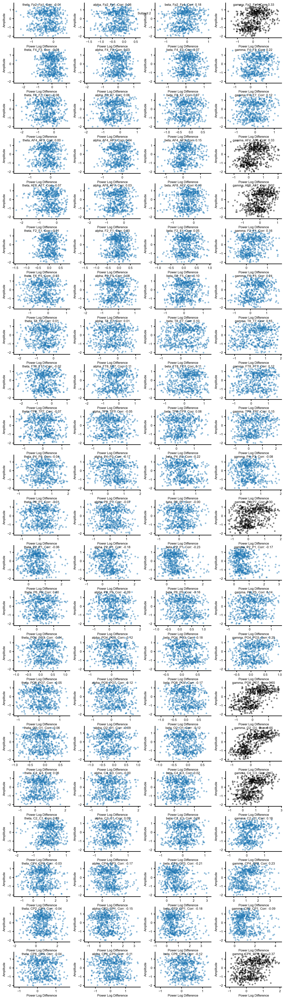

In [14]:
def plot_power_amplitude(data_all_subjects, all_subject_amplitude_data, subject_index=2, show_plot=True):
    all_amplitudes = all_subject_amplitude_data[subject_index]
    high_correlations = {band: {} for band in freq_bands.keys()}
    corrs_abs = {f: {} for f in freq_bands.keys()}
    corrs = {f: {} for f in freq_bands.keys()}
    if show_plot:
        fig, axs = plt.subplots(nrows=22, ncols=4, figsize=(10, 35))
        fig.suptitle(f"Subject {subject_index}")
        fig.tight_layout()
    for ch_idx, ch_pair in enumerate(log_diffs_t300.keys()):
        for b_idx, band_name in enumerate(freq_bands.keys()):
            power_diffs = np.array(data_all_subjects[subject_index][band_name][ch_pair])
            amplitudes = np.array(all_amplitudes)
            
            # Remove top 1% of power differences
            top_1_percent_power = np.percentile(power_diffs, 99)
            bottom_1_percent_power = np.percentile(power_diffs, 1)
            indices_top = power_diffs <= top_1_percent_power
            indices_bottom = power_diffs >= bottom_1_percent_power

            top_1_percent_amplitude = np.percentile(amplitudes, 99)
            bottom_1_percent_amplitude = np.percentile(amplitudes, 1)
            indices_top_amplitude = amplitudes <= top_1_percent_amplitude
            indices_bottom_amplitude = amplitudes >= bottom_1_percent_amplitude
            indices = indices_top & indices_bottom & indices_top_amplitude & indices_bottom_amplitude

            corr = np.corrcoef(power_diffs[indices], amplitudes[indices])[0, 1]
            corrs[band_name][ch_pair] = corr
            corrs_abs[band_name][ch_pair] = np.abs(corr)

            if show_plot:

                axs[ch_idx, b_idx].set_xlabel('Power Log Difference')
                axs[ch_idx, b_idx].set_ylabel('Amplitude')
                axs[ch_idx, b_idx].set_title(f"{band_name}, {ch_pair}, Corr: {corr:.2f}", y=0.85)
            
                if np.abs(corr) >= 0.3:
                    high_correlations[band_name][ch_pair] = corr
                    axs[ch_idx, b_idx].scatter(power_diffs[indices], amplitudes[indices], alpha=0.4, c="black")
                else:
                    axs[ch_idx,b_idx].scatter(power_diffs[indices], amplitudes[indices], alpha=0.4)
    
                #plt.tight_layout()
                #plt.savefig(f"correlation_plots/subject_{subject_index}.png")
                #plt.show()
    
    return high_correlations, corrs, corrs_abs

# Example usage
high_correlations = plot_power_amplitude(data_all_subjects, all_subject_amplitude_data, subject_index=2)
print(high_correlations)


In [28]:
def plot_power_amplitude(data_all_subjects, all_subject_amplitude_data, subject_index=2, show_plot=True, treshhold=0.3):
    all_amplitudes = all_subject_amplitude_data[subject_index]
    high_correlations = {band: {} for band in freq_bands.keys()}
    corrs_abs = {f: {} for f in freq_bands.keys()}
    corrs = {f: {} for f in freq_bands.keys()}
    if show_plot:
        fig, axs = plt.subplots(nrows=22, ncols=4, figsize=(10, 35))
        fig.suptitle(f"Subject {subject_index}")
        fig.tight_layout()
    for ch_idx, ch_pair in enumerate(log_diffs_t300.keys()):
        for b_idx, band_name in enumerate(freq_bands.keys()):
            power_diffs = np.array(data_all_subjects[subject_index][band_name][ch_pair])
            amplitudes = np.array(all_amplitudes)
            
            # Remove top 1% of power differences
            top_1_percent_power = np.percentile(power_diffs, 99)
            bottom_1_percent_power = np.percentile(power_diffs, 1)
            indices_top = power_diffs <= top_1_percent_power
            indices_bottom = power_diffs >= bottom_1_percent_power

            top_1_percent_amplitude = np.percentile(amplitudes, 99)
            bottom_1_percent_amplitude = np.percentile(amplitudes, 1)
            indices_top_amplitude = amplitudes <= top_1_percent_amplitude
            indices_bottom_amplitude = amplitudes >= bottom_1_percent_amplitude
            indices = indices_top & indices_bottom & indices_top_amplitude & indices_bottom_amplitude

            corr = np.corrcoef(power_diffs[indices], amplitudes[indices])[0, 1]
            corrs[band_name][ch_pair] = corr
            corrs_abs[band_name][ch_pair] = np.abs(corr)
            if np.abs(corr) >= treshhold:
                high_correlations[band_name][ch_pair] = np.abs(corr)

            if show_plot:

                axs[ch_idx, b_idx].set_xlabel('Power Log Difference')
                axs[ch_idx, b_idx].set_ylabel('Amplitude')
                axs[ch_idx, b_idx].set_title(f"{band_name}, {ch_pair}, Corr: {corr:.2f}", y=0.85)
            
                if np.abs(corr) >= threshold:
                    high_correlations[band_name][ch_pair] = corr
                    axs[ch_idx, b_idx].scatter(power_diffs[indices], amplitudes[indices], alpha=0.4, c="black")
                else:
                    axs[ch_idx,b_idx].scatter(power_diffs[indices], amplitudes[indices], alpha=0.4)
    
                #plt.tight_layout()
                #plt.savefig(f"correlation_plots/subject_{subject_index}.png")
                #plt.show()
    
    return high_correlations, corrs, corrs_abs

# Example usage
high_correlations, corrs, corrs_abs = plot_power_amplitude(data_all_subjects, all_subject_amplitude_data, subject_index=2, show_plot=False)
print(high_correlations)


{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {'Fp2_Fp1': 0.33478032390583967, 'AF4_AF3': 0.3263413173523243, 'AF8_AF7': 0.3231063767947742, 'P8_P7': 0.30266050513344755, 'PO8_PO7': 0.5545783170075805, 'O2_O1': 0.6486812902824911, 'C4_C3': 0.4664148730826674, 'CP6_CP5': 0.36709991093126265}}


In [29]:
all_subjects = {si: [] for si in cfg.dataset.test_subject_indices}
for subject_index in cfg.dataset.test_subject_indices:
    all_subjects[subject_index]= plot_power_amplitude(data_all_subjects, all_subject_amplitude_data, subject_index=subject_index, show_plot=False)[0]
    #print(high_correlations)

In [14]:
cfg = load_config()
all_subjects_highest_corrs_all = {subject_index: plot_power_amplitude(data_all_subjects, all_subject_amplitude_data, subject_index=subject_index, show_plot=False)[1] for subject_index in cfg.dataset.test_subject_indices}
all_subjects_highest_corrs_all_abs = {subject_index: plot_power_amplitude(data_all_subjects, all_subject_amplitude_data, subject_index=subject_index, show_plot=False)[2] for subject_index in cfg.dataset.test_subject_indices}



In [17]:
np.save("all_subjects_highest_corrs_all_channel_wise_connectivity.npy", all_subjects_highest_corrs_all)
np.save("all_subjects_highest_corrs_all_abs_channel_wise_connectivity.npy", all_subjects_highest_corrs_all_abs)

# analysis for raw labels

In [39]:

def get_raw_labels(subject_index):
    cfg = load_config()
    cwd = os.getcwd()
    dir_path = os.path.join(cwd, "frequency_power_data")
    cfg = load_config()
    cfg.dataset.data_directory = dir_path
    cfg.dataset.subject_index = subject_index
    cfg.exp_name = f"S4_S4EEGNet_ema_100_cal_py_{cfg.dataset.subject_index}"
    cli_args = parse_args()
    cfg = update_config(cfg, cli_args)
    save_config(cfg)
    all_epochs, all_labels_raw, fixed_median, fixed_q1, fixed_q3, labels_scaler, mean_mep, ch_names = load_eeg_data(cfg)
    return all_labels_raw[150:]

In [40]:
cfg = load_config()
all_subjects_raw_labels = {}
for subject_index in cfg.dataset.test_subject_indices:
    all_subjects_raw_labels[subject_index] = get_raw_labels(subject_index)

wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 1
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_1_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation mat

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_001_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
510 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 2
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_2_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subje

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 13
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_13_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_013_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
633 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 24
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_24_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_024_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
535 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 29
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_29_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_029_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
731 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 34
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_34_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_034_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
784 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 42
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_42_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_042_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
788 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 43
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_43_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_043_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
727 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 52
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_52_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_052_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
654 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 60
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_60_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_060_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
752 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 62
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_62_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_062_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
773 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 67
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_67_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_067_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
646 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 69
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_69_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_069_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
599 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
wandb:
  key: f0c92a0059bf12e2647f0a1c22fdcd12555fa6df
model: null
dataset:
  data_directory: /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data
  file_name: subject_{:03d}_preprocessed_combined_py.fif
  exclude_timepoints: 100
  subject_index: 80
  test_subject_indices:
  - 1
  - 2
  - 13
  - 24
  - 29
  - 34
  - 42
  - 43
  - 52
  - 60
  - 62
  - 67
  - 69
  - 80
training:
  training_start_len: 100
  pretrain_epochs: 100
  pretrain_lr: 0.0001
  val_window_len: 1
  epochs_per_window: 10
  num_warmup_epochs: 5
  num_epochs: 800
  slide_step: 1
  batch_size: 50
  random_seed: 42
  precision: bf16
  kde_lambda: 0.5
  finetune_entire_model: true
exp_name: S4_S4EEGNet_ema_100_cal_py_80_

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/sub

/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/frequency_power_data/subject_080_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
760 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)


{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {'occipital': 0.5659342869951844}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {'occipital': -0.5502400461265946}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {}}
{'theta': {'frontal': 0.3650385128597128, 'temporal': 0.40352473114842136, 'parietal': 0.5364573912273278}, 'alpha': {'parietal': 0.49443122889145347}, 'beta': {'temporal': 0.49778514941435675, 'parietal': 0.49779439177146645}, 'gamma': {'temporal': 0.45409114641654114, 'parietal': 0.41839060000539674, 'central': 0.3364638652932656}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {'frontal': -0.5238352061833912}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {'frontal': 0.3425173046649101}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {'central': -0.3321933323104648}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamma': {}}
{'theta': {}, 'alpha': {}, 'beta': {}, 'gamm

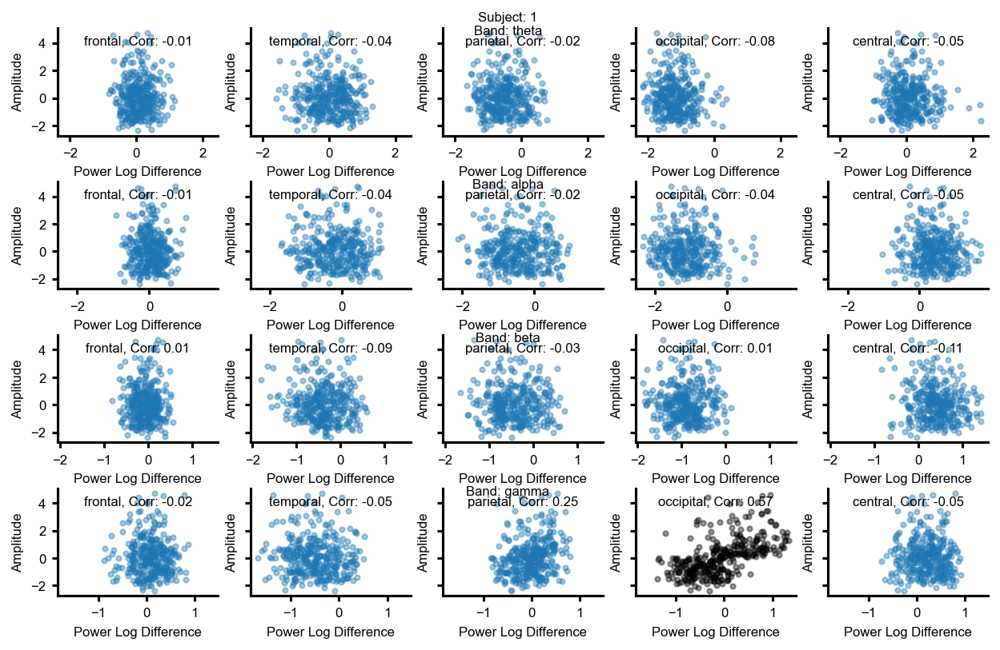

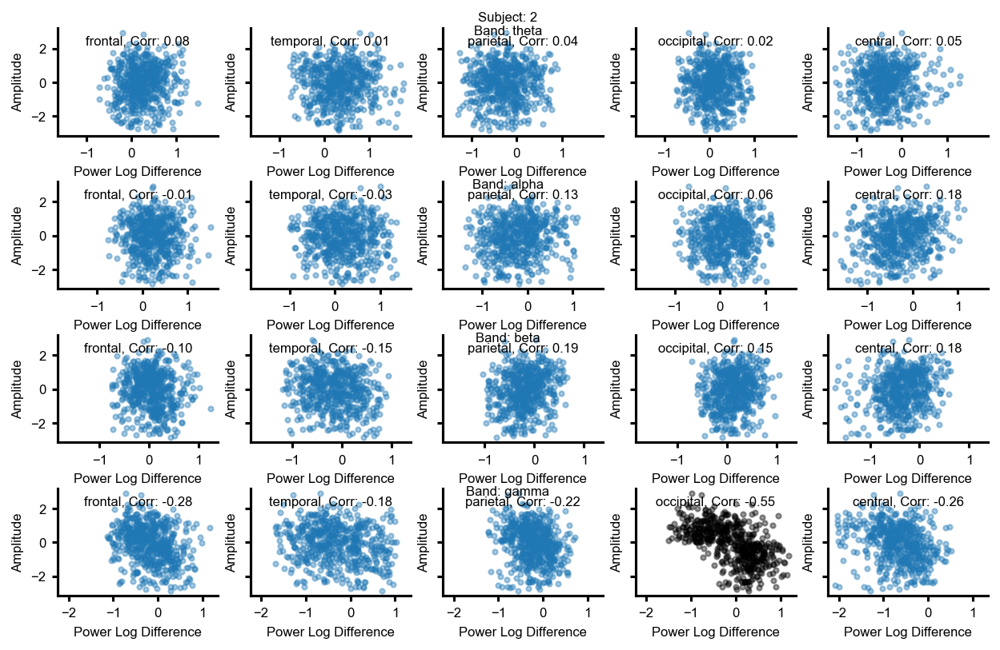

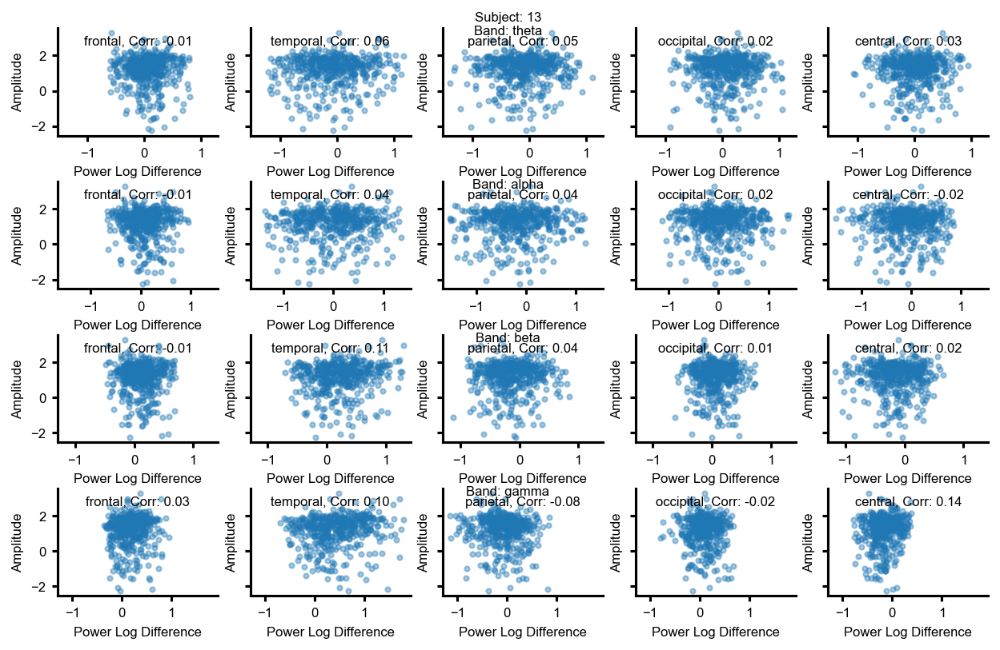

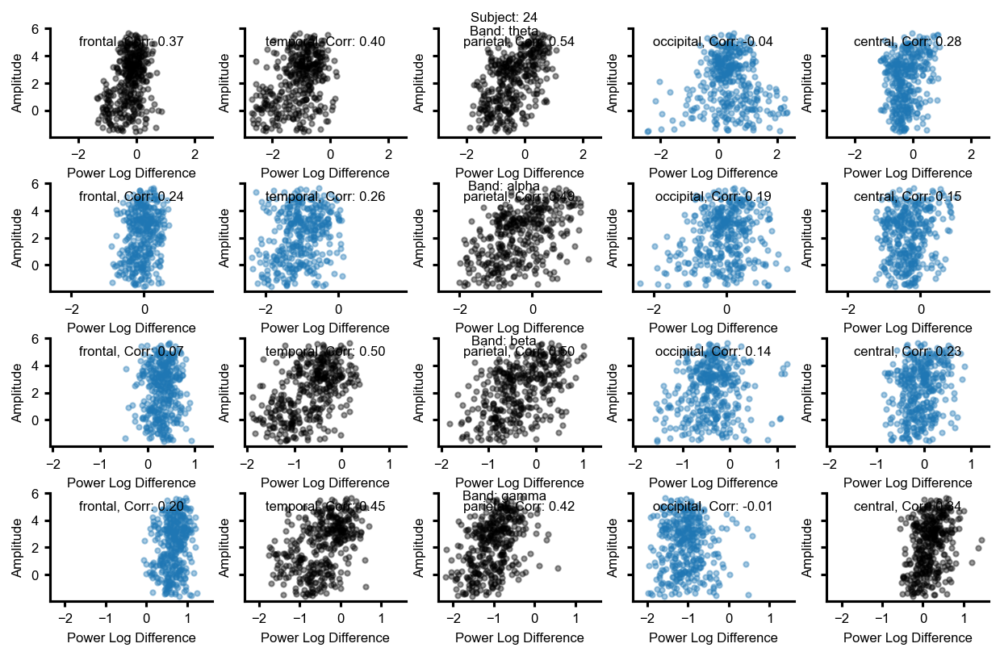

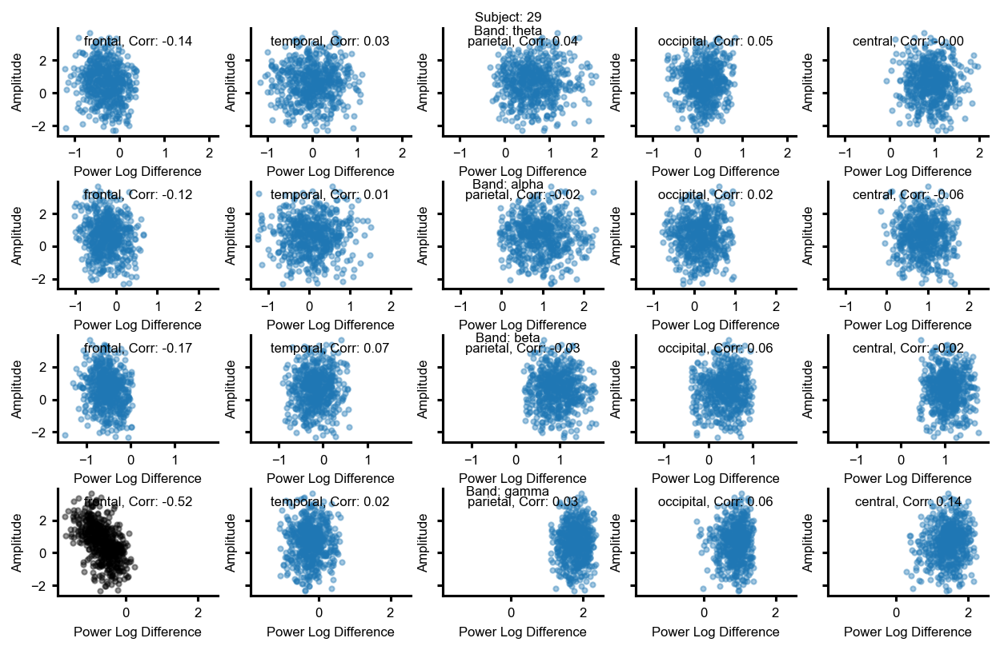

...

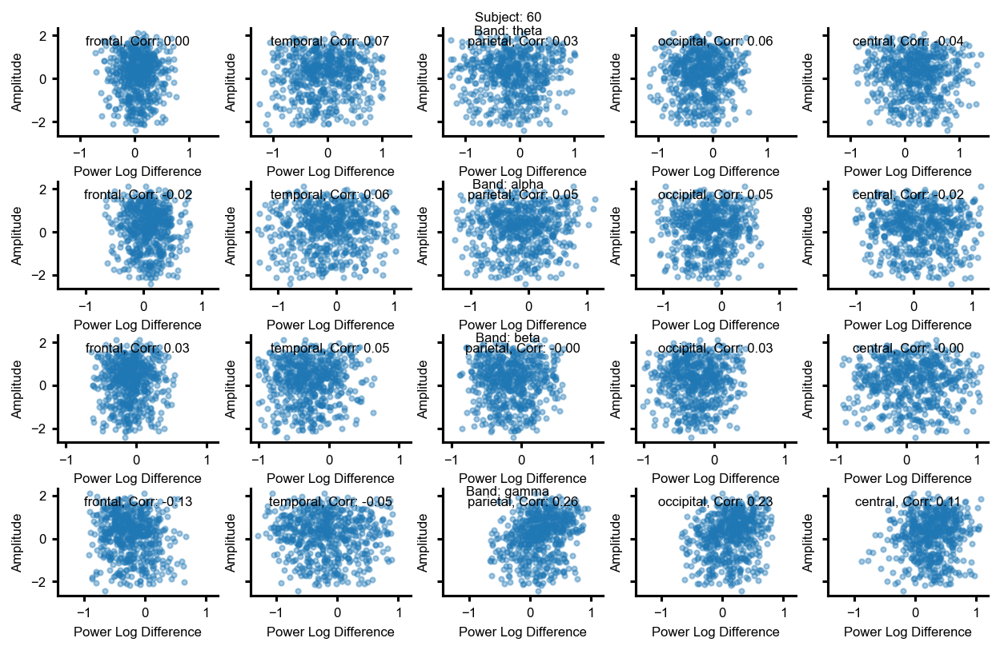

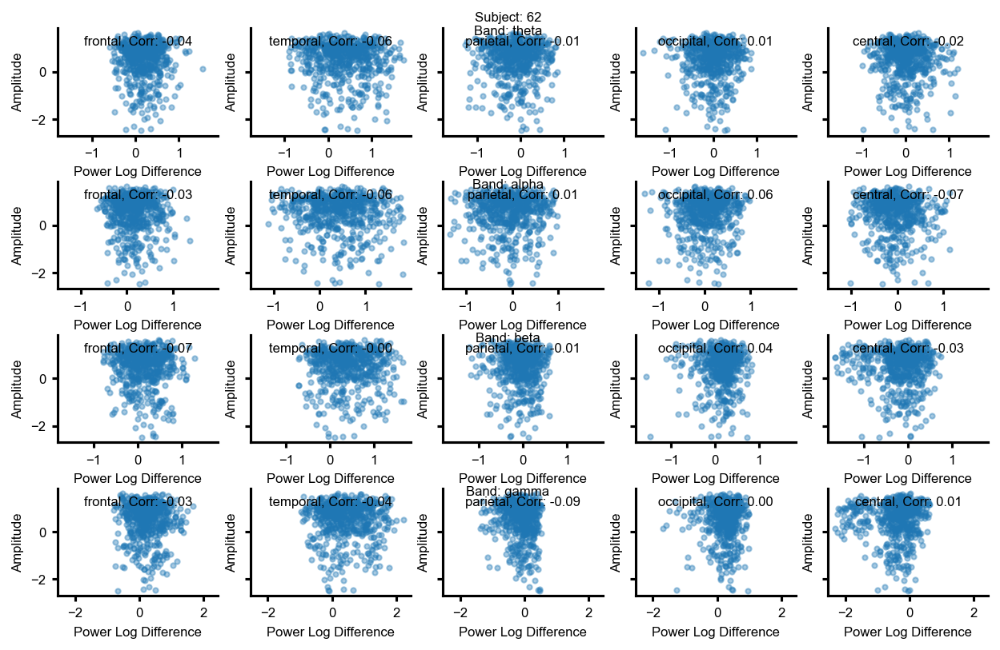

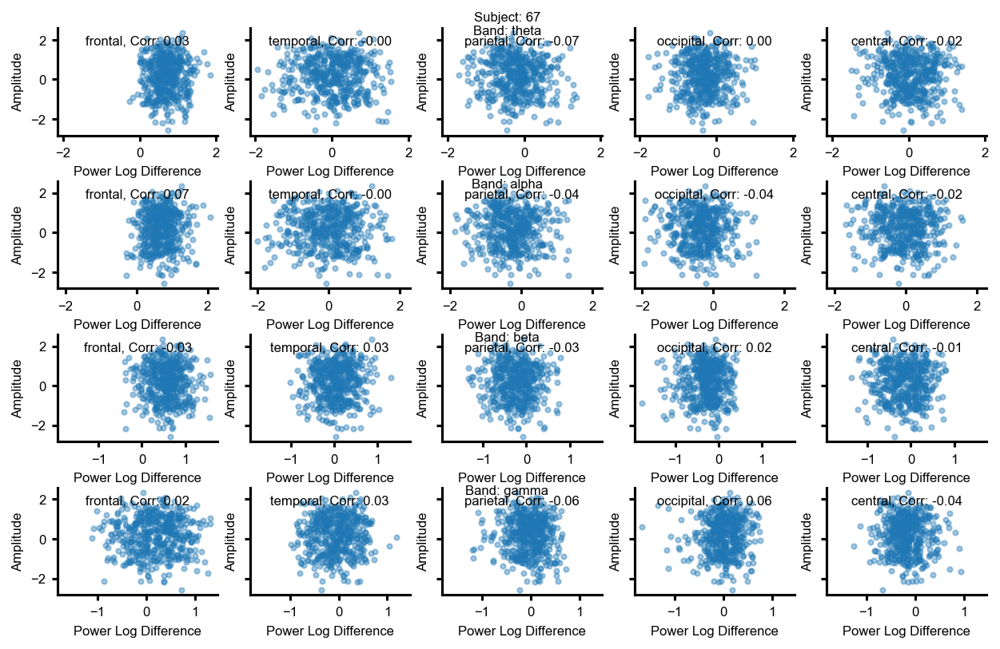

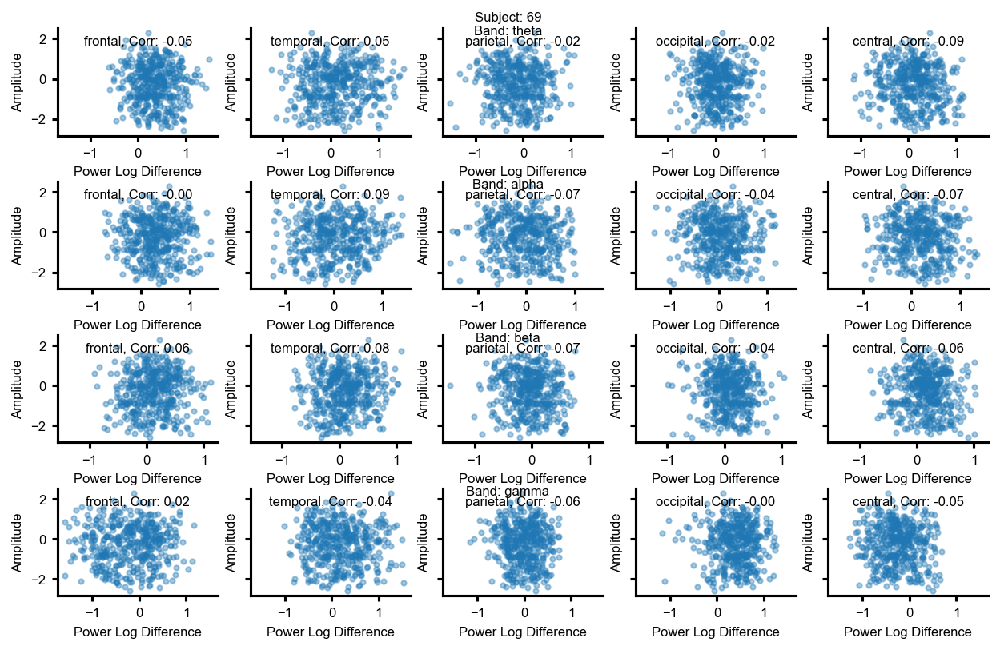

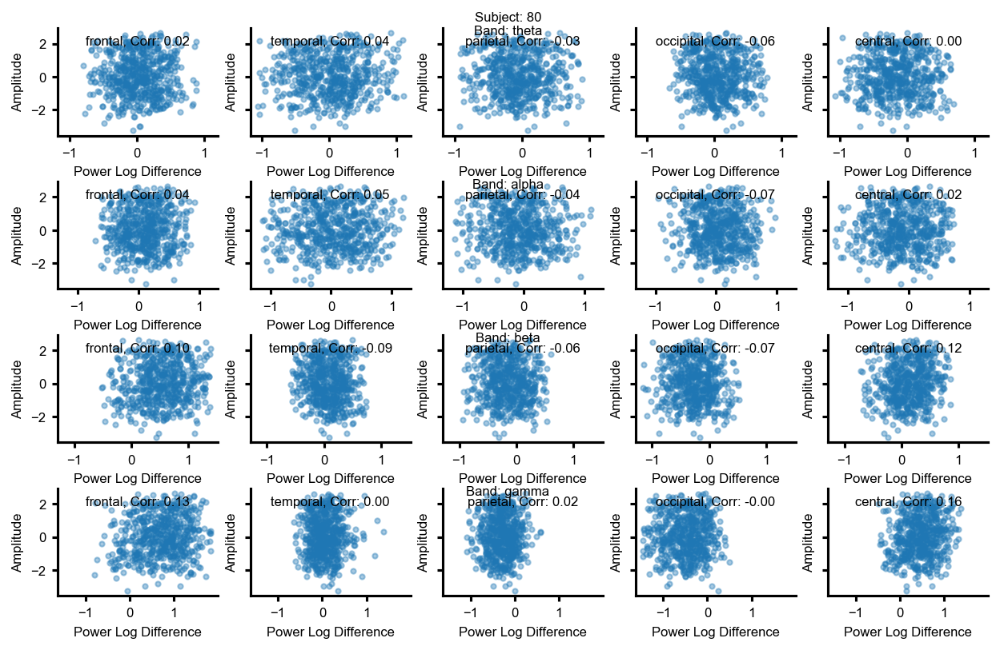

In [41]:
for subject_index in cfg.dataset.test_subject_indices:
    high_correlations = plot_power_amplitude(data_all_subjects, all_subjects_raw_labels, subject_index=subject_index)
    print(high_correlations)

the results for the raw and predicted labels are very similar.

# comparison of significant channels pairs with top k channels

In [12]:
# award importance to a channel according to their importance ranking in a time point
def update_channel_points_linear(top_k_channel_names, channel_point_dict):
    for i, channel_name in enumerate(top_k_channel_names):
        channel_point_dict[channel_name] += 10-i
    return channel_point_dict

# award importance to a channel according to their importance ranking in a time point
def update_channel_points_same(top_k_channel_names, channel_point_dict):
    for i, channel_name in enumerate(top_k_channel_names):
        channel_point_dict[channel_name] += 1
    return channel_point_dict

def get_top_k_channels_per_timepoint(time_point_data, ch_names, k):
    # trial is of shape channels x timepoins
    # for each timepoint, find indices of top_k channels with highest activations 
    top_k_channels_indices = np.argsort(time_point_data)[::-1][:k]
    # get the channel names of the top_k channels 
    top_k_channels_names = np.take(ch_names, top_k_channels_indices)
    #print(top_k_channels_names)
    return top_k_channels_names


# adapt so you can see a running list of top channes per trial
def get_top_k_channels_per_trial(trial, ch_names, channel_point_dict , k, update_func):
    for time_point in range(trial.shape[1]):
        #print(f"time_point: {time_point}")
        top_k_channel_names = get_top_k_channels_per_timepoint(trial[:,time_point], ch_names, k)
        # update the points of the top_k channels of the timepoint according to the (linear, stricly monotone falling) update function
        # 
        # NOTE while assumption that all trials are equally important holds, assumption that all timepoints are equally important is very questionable. 
        # Maybe think about this part again
        channel_point_dict = update_func(top_k_channel_names, channel_point_dict)
    return channel_point_dict

def get_top_k_channels(aggregate_dict, aggregate_dict_key, ch_names, k, update_func):
    # get the channel importance for each channel according to the explanation method
    # a ranking approach is chosen s.t. each timepoint in a trial and each trial is equally important

    # init dict for storing points per channel

    channel_point_dicts_over_time = []

    channel_point_dict = {}
    for ch in ch_names:
        channel_point_dict[ch] = 0
    
    data = aggregate_dict[aggregate_dict_key].squeeze()
    # go through each trial in the dataset and assign points for each
    for trial in data:
        #print(trial.shape)
        channel_point_dict = get_top_k_channels_per_trial(trial, ch_names, channel_point_dict, k, update_func)
        channel_point_dicts_over_time.append(copy.deepcopy(channel_point_dict))
        #print(channel_point_dicts_over_time)
    
    top_k_channels = sorted(channel_point_dict, key=channel_point_dict.get, reverse=True)[:k]
    return top_k_channels, channel_point_dicts_over_time
    
def format_point_progression(point_progressions, ch_names):
    # this function collects the points over time per channel properly s.t. the point progression over time can easily be plotted
    point_progression_dict = {}
    for ch in ch_names:
        point_progression_dict[ch] = []


    for dict in point_progressions:
        for ch in ch_names:
            point_progression_dict[ch].append(dict[ch])

    return point_progression_dict


cwd = os.getcwd()
dir_path = os.path.join(cwd, "frequency_power_data")

freq_bands = {"theta": (4, 8),
              "alpha": (8, 12),
              "beta": (12, 30),
              "gamma": (30, 45)}



In [15]:
def top_k_channel_per_trial_weighted(trial, ch_names,  channel_points_dict, k, update_func, aggregation_func=np.mean, **kwargs):
    # aggregate the importances award to each "pixel" in the trial over the time_point dimension according to the provided aggreagation_func
    #print(trial.shape)
    agg_points_per_channel = aggregation_func(trial, **kwargs)

    #print(agg_points_per_channel.shape)
    # get the indices of the top k channels
    top_k_channels_indices = np.argsort(agg_points_per_channel)[::-1][:k]
    top_k_channels_names = np.take(ch_names, top_k_channels_indices)
    #print(top_k_channels_names)
    # update the channels points according to the provided update func
    channel_points_dict = update_func(top_k_channels_names, channel_points_dict)
    return channel_points_dict

def get_top_k_weighted(aggregate_dict, aggregate_dict_key, ch_names, k, update_func, groupby_indices=np.array([])):
    #the previous top-k function considers each timepoint and each trial equally important.
    #in this version now each trial is still assumed to be equally important.
    #However, each timepoints importance is now weighted by the importance attributed to it by the attribution method.
    #we take the mean over the timepoint dimension. On one hand this increases susceptability to outliers, on the other hand it better allows
    #for some timepoints to be more important than others which I assume(for now) can absolutely be the case
    channel_point_dicts_over_time = []

    channel_point_dict = {}
    for ch in ch_names:
        channel_point_dict[ch] = 0

    if groupby_indices.any():
        data = aggregate_dict[aggregate_dict_key].squeeze()[groupby_indices]
    else:
        data = aggregate_dict[aggregate_dict_key].squeeze()
    # go through each trial in the dataset and assign points for each



    for trial in data:
        channel_point_dict = top_k_channel_per_trial_weighted(trial, ch_names, channel_point_dict, k, update_func, aggregation_func=np.mean, axis=1)
        channel_point_dicts_over_time.append(copy.deepcopy(channel_point_dict))

    top_k_channels = sorted(channel_point_dict, key=channel_point_dict.get, reverse=True)[:k]
    
    return top_k_channels, channel_point_dicts_over_time
    

def get_top_k_weighted_individual(aggregate_dict, aggregate_dict_key, ch_names, k, update_func, groupby_indices=np.array([])):
    # unlike the upper version which collects cumulative points per channel over trials
    # this function outputs the top-k chanels per trial for each trial individually
    channel_point_dicts_individual_trials = []

    if groupby_indices.any():
        data = aggregate_dict[aggregate_dict_key].squeeze()[groupby_indices]
    else:
        data = aggregate_dict[aggregate_dict_key].squeeze()

    for trial in data:
        channel_point_dict = {}
        for ch in ch_names:
            channel_point_dict[ch] = 0

        #print(trial.shape)
        channel_point_dict = top_k_channel_per_trial_weighted(trial, ch_names, channel_point_dict, k, update_func, axis=1)
        channel_point_dicts_individual_trials.append(copy.deepcopy(channel_point_dict))
        #print(channel_point_dicts_over_time)

    temp = format_point_progression(channel_point_dicts_individual_trials, ch_names)
    sum_over_channel_points_dict = {key: sum(value) for key,value in temp.items()}
    top_k_channels = sorted(sum_over_channel_points_dict, key=sum_over_channel_points_dict.get, reverse=True)[:k]
    #top_k_channels_dict = {ch: sum_over_channel_points_dict[ch] for ch in top_k_channels}
    

    return top_k_channels, channel_point_dicts_individual_trials,sum_over_channel_points_dict


def top_k_groupby(aggregate_dict, aggregate_dict_key, groupby_dict, ch_names, k, update_func, top_k_func=get_top_k_weighted):
    groupby_channel_points_dict =  {}
    for groupby_key, groupby_indices in groupby_dict.items():
        groupby_channel_points_dict[groupby_key] = top_k_func(aggregate_dict, aggregate_dict_key, ch_names, k, update_func, groupby_indices)
    
    return groupby_channel_points_dict
 
 

In [16]:
cfg = load_config()
top_10_per_subject = []
load_path = "/home/marco/Documents/GitHub/tms_eeg_decoding/subject_interpretability"
for subject_index in cfg.dataset.test_subject_indices:
    cfg.dataset.subject_index = subject_index
    _, _, _, _, _, _, _, ch_names = load_eeg_data(cfg)


    
    with open(os.path.join(load_path, f"subject_{subject_index}_results.pkl"), 'rb') as f:
        data = pickle.load(f)
        gradshap = data['explanations']
    top_10_channels, channel_point_dicts_individual_trials,sum_over_channel_points_dict = get_top_k_weighted_individual({"gradshap": np.abs(gradshap)}, "gradshap", ch_names, 10, update_channel_points_linear)
    top_10_per_subject.append(top_10_channels)

Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_001_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_001_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
510 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_002_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_002_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
721 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_013_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_013_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
633 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_024_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_024_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
535 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_026_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_026_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
603 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_027_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_027_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
525 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_029_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_029_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
731 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_034_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_034_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
784 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_035_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_035_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
523 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_041_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_041_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
764 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_042_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_042_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
788 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_043_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_043_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
727 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_045_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_045_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
647 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_046_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_046_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
705 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_047_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_047_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
751 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_048_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_048_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
500 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_052_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_052_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
654 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_055_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_055_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
657 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_056_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_056_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
585 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_057_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_057_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
672 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_060_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_060_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
752 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_062_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_062_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
773 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_067_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_067_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
646 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_069_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_069_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
599 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_072_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_072_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
702 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_073_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_073_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
620 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_079_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_079_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
773 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_080_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_080_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
760 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_086_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_086_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
736 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_088_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_088_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
608 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_092_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_092_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
564 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)
Loading EEG data...
Reading /home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_102_preprocessed_combined_py.fif ...
    Found the data of interest:
        t =   -1005.00 ...    -805.20 ms
        0 CTF compensation matrices available


/home/marco/Documents/GitHub/tms_eeg_decoding/frequency_power_analysis/data/data_loader.py:41: RuntimeWarning: This filename (/home/marco/Documents/GitHub/tms_eeg_decoding/data/subject_102_preprocessed_combined_py.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs = mne.read_epochs(file_path) # (trials, channels, timepoints)


Adding metadata with 1 columns
789 matching events found
No baseline correction applied
0 projection items activated
(100, 60, 900)
(1, 60, 1)


## gamma frequency band

Subject 1:
Top k channels: ['O2', 'CP5', 'O1', 'FC2', 'P2', 'PO7', 'PO8', 'FC1', 'Cz', 'P1']
Channels with high correlation in gamma band: ['PO4_PO3', 'PO8_PO7', 'O2_O1']
Number of common channels: 4
Ratio: 0.67

Subject 2:
Top k channels: ['PO8', 'CP4', 'C4', 'O2', 'P2', 'FC2', 'Iz', 'FC1', 'C6', 'Cz']
Channels with high correlation in gamma band: ['Fp2_Fp1', 'AF4_AF3', 'AF8_AF7', 'P8_P7', 'PO8_PO7', 'O2_O1', 'C4_C3', 'CP6_CP5']
Number of common channels: 3
Ratio: 0.30

Subject 13:
Top k channels: ['C1', 'POz', 'F6', 'PO3', 'C2', 'Cz', 'P2', 'CPz', 'CP1', 'AF3']
Channels with high correlation in gamma band: []
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'FC2', 'P8', 'C6', 'O2', 'FC1', 'Cz', 'P2', 'PO7', 'Oz']
Channels with high correlation in gamma band: ['Fp2_Fp1', 'AF4_AF3', 'AF8_AF7', 'F6_F5', 'T8_T7', 'FT8_FT7', 'P4_P3', 'C2_C1', 'CP4_CP3', 'CP2_CP1']
Number of common channels: 0
Ratio: 0.00

Subject 26:
Top k channels: ['POz', 'PO3', 'Oz', 'P2', 

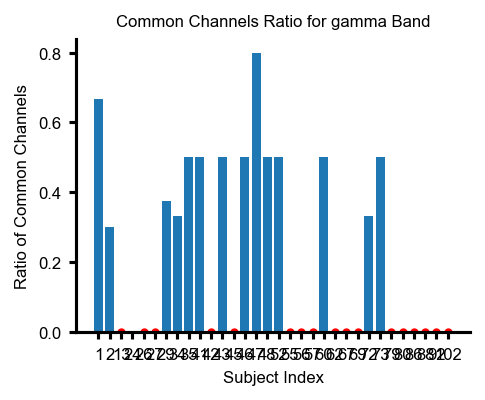

In [30]:
def compare_channels(cfg, top_k_per_subject, all_subjects_highest_corrs, frequency_band='gamma'):
    subject_ratios = []
    subject_common_channels = []
    subject_sig_channels = []
    for subject_index in cfg.dataset.test_subject_indices:
        print(f"Subject {subject_index}:")
        print("Top k channels:", top_k_per_subject[cfg.dataset.test_subject_indices.index(subject_index)])
        print(f"Channels with high correlation in {frequency_band} band:", list(all_subjects_highest_corrs[subject_index][frequency_band].keys()))

        flattened_array = [item for sublist in list(map(lambda x: x.split("_"), all_subjects_highest_corrs[subject_index][frequency_band].keys())) for item in sublist]
        #common_channels = set(top_k_per_subject[subject_index]) & set(all_subjects_highest_corrs[subject_index][frequency_band].keys())
        common_channels = set(top_k_per_subject[cfg.dataset.test_subject_indices.index(subject_index)]) & set(flattened_array)
        num_common_channels = len(common_channels)
        num_significant_channels = len(all_subjects_highest_corrs[subject_index][frequency_band].
                                       keys())
        #denominator = max(1, min(len(top_k_per_subject[subject_index]), len(all_subjects_highest_corrs[subject_index][frequency_band].keys())))
        denominator = max(1, min(len(top_k_per_subject[cfg.dataset.test_subject_indices.index(subject_index)]), len(flattened_array)))
        ratio = num_common_channels / denominator
        subject_common_channels.append(num_common_channels)
        subject_ratios.append(ratio)
        subject_sig_channels.append(num_significant_channels)
        print(f"Number of common channels: {num_common_channels}")
        print(f"Ratio: {ratio:.2f}")
        print()
    
    empty_list_indices = subject_common_channels[subject_common_channels ==0]
    plt.bar(np.arange(len(subject_ratios)), subject_ratios)
    for idx, num_sig in enumerate(subject_sig_channels):
        if num_sig == 0:
            plt.plot(idx, subject_ratios[idx], 'ro')

    plt.xticks(np.arange(len(subject_ratios)), cfg.dataset.test_subject_indices)
    plt.xlabel('Subject Index')
    plt.ylabel('Ratio of Common Channels')
    plt.title(f'Common Channels Ratio for {frequency_band} Band')
    plt.savefig(f"common_channels_ratio_{frequency_band}_channel_wise_connectivity.png")
    plt.show()

# Example usage:
compare_channels(cfg, top_10_per_subject, all_subjects, frequency_band='gamma')

## beta frequency band

Subject 1:
Top k channels: ['O2', 'CP5', 'O1', 'FC2', 'P2', 'PO7', 'PO8', 'FC1', 'Cz', 'P1']
Channels with high correlation in beta band: []
Number of common channels: 0
Ratio: 0.00

Subject 2:
Top k channels: ['PO8', 'CP4', 'C4', 'O2', 'P2', 'FC2', 'Iz', 'FC1', 'C6', 'Cz']
Channels with high correlation in beta band: []
Number of common channels: 0
Ratio: 0.00

Subject 13:
Top k channels: ['C1', 'POz', 'F6', 'PO3', 'C2', 'Cz', 'P2', 'CPz', 'CP1', 'AF3']
Channels with high correlation in beta band: []
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'FC2', 'P8', 'C6', 'O2', 'FC1', 'Cz', 'P2', 'PO7', 'Oz']
Channels with high correlation in beta band: ['Fp2_Fp1', 'F4_F3', 'AF4_AF3', 'AF8_AF7', 'F6_F5', 'T8_T7', 'FT8_FT7', 'P4_P3', 'P6_P5', 'C2_C1', 'CP4_CP3', 'CP2_CP1']
Number of common channels: 0
Ratio: 0.00

Subject 26:
Top k channels: ['POz', 'PO3', 'Oz', 'P2', 'P7', 'F5', 'CP2', 'CP3', 'Cz', 'FC2']
Channels with high correlation in beta band: []
Number o

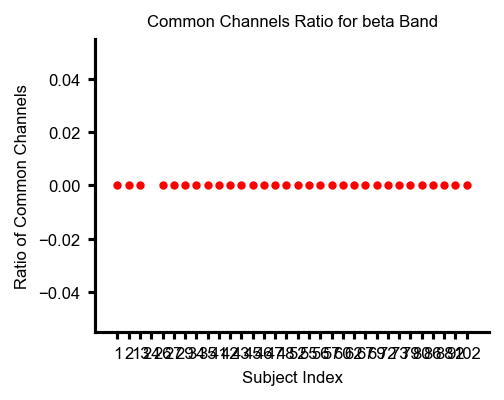

In [31]:
compare_channels(cfg, top_10_per_subject, all_subjects, frequency_band='beta')

Subject 1:
Top k channels: ['O2', 'CP5', 'O1', 'FC2', 'P2', 'PO7', 'PO8', 'FC1', 'Cz', 'P1']
Channels with high correlation in alpha band: []
Number of common channels: 0
Ratio: 0.00

Subject 2:
Top k channels: ['PO8', 'CP4', 'C4', 'O2', 'P2', 'FC2', 'Iz', 'FC1', 'C6', 'Cz']
Channels with high correlation in alpha band: []
Number of common channels: 0
Ratio: 0.00

Subject 13:
Top k channels: ['C1', 'POz', 'F6', 'PO3', 'C2', 'Cz', 'P2', 'CPz', 'CP1', 'AF3']
Channels with high correlation in alpha band: []
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'FC2', 'P8', 'C6', 'O2', 'FC1', 'Cz', 'P2', 'PO7', 'Oz']
Channels with high correlation in alpha band: ['AF8_AF7', 'F6_F5', 'T8_T7', 'P4_P3', 'P6_P5', 'PO4_PO3', 'C4_C3', 'C2_C1', 'CP4_CP3', 'CP2_CP1']
Number of common channels: 0
Ratio: 0.00

Subject 26:
Top k channels: ['POz', 'PO3', 'Oz', 'P2', 'P7', 'F5', 'CP2', 'CP3', 'Cz', 'FC2']
Channels with high correlation in alpha band: []
Number of common channels

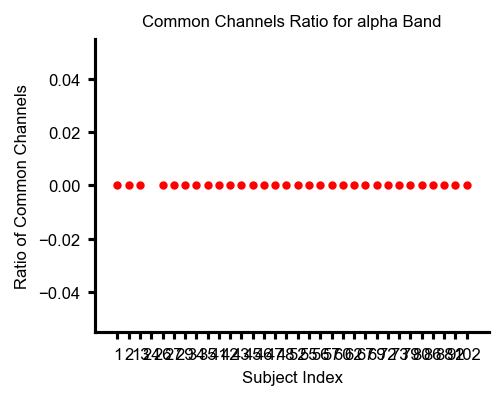

In [32]:
compare_channels(cfg, top_10_per_subject, all_subjects, frequency_band='alpha')

Subject 1:
Top k channels: ['O2', 'CP5', 'O1', 'FC2', 'P2', 'PO7', 'PO8', 'FC1', 'Cz', 'P1']
Channels with high correlation in theta band: []
Number of common channels: 0
Ratio: 0.00

Subject 2:
Top k channels: ['PO8', 'CP4', 'C4', 'O2', 'P2', 'FC2', 'Iz', 'FC1', 'C6', 'Cz']
Channels with high correlation in theta band: []
Number of common channels: 0
Ratio: 0.00

Subject 13:
Top k channels: ['C1', 'POz', 'F6', 'PO3', 'C2', 'Cz', 'P2', 'CPz', 'CP1', 'AF3']
Channels with high correlation in theta band: []
Number of common channels: 0
Ratio: 0.00

Subject 24:
Top k channels: ['TP8', 'FC2', 'P8', 'C6', 'O2', 'FC1', 'Cz', 'P2', 'PO7', 'Oz']
Channels with high correlation in theta band: ['Fp2_Fp1', 'AF4_AF3', 'AF8_AF7', 'T8_T7', 'FT8_FT7', 'TP8_TP7', 'P4_P3', 'P6_P5', 'PO4_PO3', 'C4_C3', 'C2_C1', 'CP4_CP3', 'CP2_CP1', 'CP6_CP5']
Number of common channels: 1
Ratio: 0.10

Subject 26:
Top k channels: ['POz', 'PO3', 'Oz', 'P2', 'P7', 'F5', 'CP2', 'CP3', 'Cz', 'FC2']
Channels with high correlati

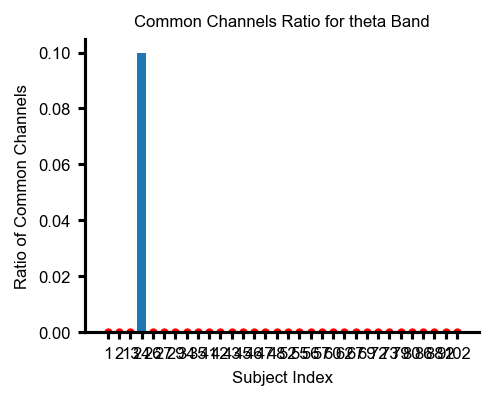

In [33]:
compare_channels(cfg, top_10_per_subject, all_subjects, frequency_band='theta')